# NLP for Valentine's Day Searches in Amazon

## Importing neccesary files

In [ ]:
import pandas as pd
import string
from nltk.tokenize import word_tokenize
from collections import Counter
import nltk

In [ ]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\jissr\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

## Dataset

<b> 2024 Amazon Best Sellers: Top Valentine Gifts"</b>: This dataset offers a snapshot of the most popular gifts purchased from Amazon for Valentine's Day in 2024, providing unique insights into consumer preferences and market dynamics during the season of love.

The dataset is structured into key columns, detailed as follows:

- > title: Name of the product.
- > brand: Brand associated with the product.
- > description: Brief description of the product.
- > starsBreakdown: Percentage distribution of ratings (3-star, 4-star, 5-star).
- > reviewsCount: Total number of reviews.
- > price: Listed price of the product in USD.
- > categoryPageData: Product's positioning data on Amazon's category pages.

In [ ]:
df = pd.read_csv('data.csv')
print(df.head())

                                               title           brand  \
0  Ferrero Rocher, 24 Count, Premium Milk Chocola...  Ferrero Rocher   
1  HERSHEY'S NUGGETS Assorted Chocolate, Valentin...       HERSHEY'S   
2  LEGO Icons Flower Bouquet Building Decoration ...            LEGO   
3  BodyRefresh Shower Steamers Aromatherapy - 8 P...     BodyRefresh   
4  JoJowell Shower Steamers Aromatherapy - 21Pcs ...        JoJowell   

                                         description  starsBreakdown/3star  \
0  Ferrero Rocher's milk chocolate gift box offer...                  0.02   
1  This HERSHEY'S NUGGETS candy assortment is fil...                  0.03   
2  Giving and receiving beautiful flowers is such...                  0.01   
3                                                NaN                  0.07   
4                                                NaN                  0.10   

   starsBreakdown/4star  starsBreakdown/5star  reviewsCount  price  \
0                  0.07     

<i><b>Among the following title, brand,description are the key areas of focus in this study</b></i>

## Objective 1: Dealing with Data
Develop a program that cleans the reviews by:
- > Converting them to lowercase for consistency.
- >Removing unnecessary symbols like punctuation and special characters.
  
Once the data is cleaned, your task is to tokenize the reviews into individual words and:
- > Calculate the total number of words across all reviews.
- > Identify and report the most frequently mentioned word along with its frequency.


<i><b>Removing punctuations and lowercasin as in objective 1.1</b></i>

In [ ]:
def clean_text(text):
    text = text.lower()  # Convert to lowercase
    text = text.translate(str.maketrans('', '', string.punctuation))  # Remove punctuation
    return text

# Clean the 'description' column
df['clean_description'] = df['description'].apply(lambda x: clean_text(str(x)))


In [ ]:
df['clean_description'].head(1)

0    ferrero rochers milk chocolate gift box offers...
Name: clean_description, dtype: object

<i><b>Entire description displayed of product 1</b></i>

In [ ]:
print(df['clean_description'].iloc[0])

ferrero rochers milk chocolate gift box offers a unique taste experience of contrasting layers a whole crunchy hazelnut in the heart and a delicious creamy hazelnut filling surrounded with milk chocolate crispy wafers and gently roasted hazelnut pieces and thanks to its signature golden wrapper ferrero rocher is even more unique and special the iconic original celebrate the moment with ferrero rocher since the 1940s ferrero has delighted consumers with premium oneofakind chocolate treats what began as a local pasticceria in italy’s piemonte region is now one of the world’s most popular confectioners satisfying cravings in over 100 countries worldwide thanks to a commitment to quality freshness and a unique taste experience ferrero continues to delight chocolate lovers all over the world


<i><b>As in objective 1.2, counter is used to collect the count of words and total no. of words among with top word is displayed</b></i>

In [ ]:
all_words = []
for review in df['clean_description']:
    all_words.extend(word_tokenize(review))

word_counts = Counter(all_words)
total_words = len(all_words)
most_common_word, most_common_count = word_counts.most_common(1)[0]

print(f"Total number of words: {total_words}")
print(f"Most frequently mentioned word: '{most_common_word}' with frequency {most_common_count}")


Total number of words: 5228
Most frequently mentioned word: 'nan' with frequency 172


<b>INFERENCE:</b> However, we identified that NaN is stored instead of empty string and we aim to remove it

In [ ]:
df['description'] = df['description'].fillna('')

In [ ]:
def clean_text(text):
    text = text.lower()  # Convert to lowercase
    text = text.translate(str.maketrans('', '', string.punctuation))  # Remove punctuation
    return text

# Clean the 'description' column
df['clean_description'] = df['description'].apply(lambda x: clean_text(str(x)))

In [ ]:
all_words = []
for review in df['clean_description']:
    all_words.extend(word_tokenize(review))

word_counts = Counter(all_words)
total_words = len(all_words)
most_common_word, most_common_count = word_counts.most_common(1)[0]

print(f"Total number of words: {total_words}")
print(f"Most frequently mentioned word: '{most_common_word}' with frequency {most_common_count}")

Total number of words: 5056
Most frequently mentioned word: 'and' with frequency 169


<b>INFERENCE: </b> Here, we obtained and which is a common word

<i><b>Inorder to identify most common gift, we intend to display top 20 list </b></i>

In [ ]:
top_20_words = word_counts.most_common(20)
top_20_df = pd.DataFrame(top_20_words, columns=['Word', 'Count'])

In [ ]:
print(top_20_df)

          Word  Count
0          and    169
1          the    132
2            a    122
3         with    100
4   valentines     98
5          for     94
6           to     90
7           of     83
8          day     79
9    chocolate     76
10       candy     65
11          in     61
12        gift     55
13        your     55
14          is     47
15        this     45
16          or     45
17       gifts     42
18         you     37
19         are     35


<b>INFERENCE: </b>and candy was the most common bought gift

## Objective 2: Edit Distance for Product Name Correction


Customers often misspell product names while searching. Write a program to compute the edit distance between a customer’s search query and the correct product name. Suggest the correct product name if the edit distance is below a certain threshold.


<i><b>We intend to take a list of product titles and based on that do autocorrection as comparing with existing reviews might give wrong suggestions as users might have texted wrong input already</b></i>

In [ ]:
df['title'].head()

0    Ferrero Rocher, 24 Count, Premium Milk Chocola...
1    HERSHEY'S NUGGETS Assorted Chocolate, Valentin...
2    LEGO Icons Flower Bouquet Building Decoration ...
3    BodyRefresh Shower Steamers Aromatherapy - 8 P...
4    JoJowell Shower Steamers Aromatherapy - 21Pcs ...
Name: title, dtype: object

In [ ]:
from nltk.metrics import edit_distance

In [ ]:
product_names = df['title'].tolist()


In [ ]:
product_names[:5]

["Ferrero Rocher, 24 Count, Premium Milk Chocolate Hazelnut, Valentine's Chocolate Gift Box, 10.6 oz",
 "HERSHEY'S NUGGETS Assorted Chocolate, Valentine's Day Candy Party Pack, 31.5 oz",
 'LEGO Icons Flower Bouquet Building Decoration Set - Artificial Flowers with Roses, Home Accessories or Valentine Décor for Him and Her, Gift for Valentines Day, Botanical Collection for Adults, 10280',
 'BodyRefresh\xa0Shower\xa0Steamers\xa0Aromatherapy\xa0-\xa08\xa0Pack\xa0Shower\xa0Bombs\xa0with\xa0Essential\xa0Oils.\xa0Self\xa0Care\xa0Birthday\xa0Gifts\xa0for\xa0Women,\xa0Gifts\xa0for\xa0Women\xa0Men\xa0Mom,\xa0Valentines\xa0Day\xa0Gifts\xa0for\xa0Her\xa0Him',
 'JoJowell Shower Steamers Aromatherapy - 21Pcs Shower Bombs Gifts for Women Essential Oil, Nasal Relief, Self Care, Birthday Gifts for Women, Gifts for Mom, Valentines Day Gifts for Her Him']

<b>INFERENCE: </b>Each sentence is treated as a simgle entity, hence when we do edit distance directly a threshold avg value of around 90 is obtained

In [ ]:
def preprocess_text(text):
    text = text.lower().strip()  # Convert to lowercase and remove extra spaces
    return text

<b><i>A higher threshold value of 5 is set as product names in corpus mght not be that similar</i></b>

In [ ]:
def suggest_correction(query, product_names, threshold=5):
    query = preprocess_text(query)

    processed_product_names = [preprocess_text(name.split(',')[0]) for name in product_names if name]
    suggestions = [(product, edit_distance(query, product)) for product in processed_product_names]

    # Debug: Print suggestions with distances
    print("Suggestions with distances:")
    for product, dist in suggestions:
        print(f"Product: '{product}' | Distance: {dist}")

    # Filter suggestions based on the threshold
    filtered_suggestions = [(prod, dist) for prod, dist in suggestions if dist <= threshold]

    return filtered_suggestions


In [ ]:
df = pd.read_csv('data.csv')  # Ensure this is executed in your environment
product_names = df['title'].tolist()
query = "Ferro Rochr"

In [ ]:
product_names = [name.strip() for name in product_names if name and not pd.isna(name)]
corrections = suggest_correction(query, product_names)

Suggestions with distances:
Product: 'ferrero rocher' | Distance: 3
Product: 'hershey's nuggets assorted chocolate' | Distance: 30
Product: 'lego icons flower bouquet building decoration set - artificial flowers with roses' | Distance: 71
Product: 'bodyrefresh shower steamers aromatherapy - 8 pack shower bombs with essential oils. self care birthday gifts for women' | Distance: 108
Product: 'jojowell shower steamers aromatherapy - 21pcs shower bombs gifts for women essential oil' | Distance: 79
Product: 'chunrun valentines day gifts - i hope your day keychain - perfect gifts for her' | Distance: 71
Product: 'lego cherry blossoms gift for valentine's day' | Distance: 39
Product: 'body restore shower steamers aromatherapy 6 packs - valentines day gifts' | Distance: 64
Product: '40 date ideas card games for couples date night - unique date deck scratch off cards' | Distance: 75
Product: 'joyin 24 pcs valentine's day heart stress balls 1.6"x1.6" for kids' | Distance: 61
Product: 'lego sunf

In [ ]:
if corrections:
    print(f"Suggested corrections: {corrections}")
else:
    print("No suggestions found.")

Suggested corrections: [('ferrero rocher', 3), ('ferrero rocher', 3)]


<b>INFERENCE: </b>For the above mispelled word "Ferro Rochr", we obtained an apt word 'ferrero rocher' which is true

## Objective 3: N-gram Language Model for Product Recommendations

Build a bigram language model using the product descriptions dataset. Use the model to calculate the probability of a sequence of product-related terms. Also, predict the next word for a given product search query using the bigram probabilities.


In [ ]:
from nltk import ngrams
from nltk.probability import FreqDist


In [ ]:
def build_bigram_model(texts):
    bigrams = []
    for text in texts:
        tokens = word_tokenize(text)
        bigrams.extend(ngrams(tokens, 2))
    return FreqDist(bigrams)

product_descriptions = df['clean_description'].dropna().tolist()
bigram_model = build_bigram_model(product_descriptions)

In [ ]:
bigram_model.most_common(1)

[(('valentines', 'day'), 54)]

In [ ]:
def predict_next_word(bigram_model, current_word):
    possible_bigrams = [(w1, w2) for (w1, w2) in bigram_model if w1 == current_word]
    if possible_bigrams:
        return FreqDist([w2 for w1, w2 in possible_bigrams]).most_common(1)[0][0]
    return None

current_word = "chocolate"
next_word = predict_next_word(bigram_model, current_word)
print(f"Predicted next word after '{current_word}': {next_word}")


Predicted next word after 'chocolate': candy


<b>INFERENCE:</b> so clearly choclate and candy are the most frequent words

<b><i> Now we intend to build a model that can display the probability  

In [ ]:
from nltk import bigrams
from collections import Counter, defaultdict

In [ ]:

def tokenize(text):
    return nltk.word_tokenize(text.lower())

df['tokens'] = df['clean_description'].apply(tokenize)

# Create bigrams from the tokens
bigram_list = [bigram for tokens in df['tokens'] for bigram in bigrams(tokens)]

# Count bigrams and unigrams
bigram_counts = Counter(bigram_list)
unigram_counts = Counter([bigram[0] for bigram in bigram_list])

# Calculate bigram probabilities
bigram_probabilities = defaultdict(lambda: defaultdict(float))
for (w1, w2), count in bigram_counts.items():
    bigram_probabilities[w1][w2] = count / unigram_counts[w1]

# Function to calculate the probability of a sequence
def sequence_probability(sequence):
    tokens = tokenize(sequence)
    prob = 1.0
    for i in range(len(tokens) - 1):
        w1, w2 = tokens[i], tokens[i + 1]
        prob *= bigram_probabilities[w1].get(w2, 1e-10)  # Use a small value if bigram is not in the model
    return prob

# Function to predict the next word
def predict_next_word(sequence):
    tokens = tokenize(sequence)
    last_word = tokens[-1]
    next_word_probs = bigram_probabilities[last_word]
    if not next_word_probs:
        return None
    next_word = max(next_word_probs, key=next_word_probs.get)
    return next_word





In [ ]:
sequence = "chocolate gift"
print(f"Probability of sequence '{sequence}': {sequence_probability(sequence)}")

next_word = predict_next_word("chocolate")
print(f"Predicted next word for 'chocolate': {next_word}")

Probability of sequence 'chocolate gift': 0.10526315789473684
Predicted next word for 'chocolate': candy


<b>INFERENCE:</b> choclate gift occuring together has a probability of around 10%  and next word afte choclate is candy

In [ ]:
sequence = "chocolate candy"
print(f"Probability of sequence '{sequence}': {sequence_probability(sequence)}")

Probability of sequence 'chocolate candy': 0.15789473684210525


## Objective 4:  Named Entity Recognition (NER) for Reviews

Implement NER to extract product names, brands, and other important entities from customer reviews. For example, identify which reviews mention the brand “AAA" or the product category "QQQ".


<b><i> The brand we chose is Ferrero Rocher and for doing this we call en_core_web_sm module from spacy

In [ ]:
import spacy
nlp = spacy.load('en_core_web_sm')


In [ ]:
def extract_entities(text):
    doc = nlp(text)
    entities = {}
    for ent in doc.ents:
        if ent.label_ not in entities:
            entities[ent.label_] = set()
        entities[ent.label_].add(ent.text)
    return entities

df['entities'] = df['description'].apply(lambda x: extract_entities(str(x)))

In [ ]:
print(df[['title', 'entities']].head())

                                               title  \
0  Ferrero Rocher, 24 Count, Premium Milk Chocola...   
1  HERSHEY'S NUGGETS Assorted Chocolate, Valentin...   
2  LEGO Icons Flower Bouquet Building Decoration ...   
3  BodyRefresh Shower Steamers Aromatherapy - 8 P...   
4  JoJowell Shower Steamers Aromatherapy - 21Pcs ...   

                                            entities  
0  {'PERSON': {'Ferrero', 'Ferrero Rocher's', 'Fe...  
1  {'ORG': {'NUGGETS', 'HERSHEY'S SPECIAL DARK', ...  
2  {'DATE': {'10280'}, 'ORG': {'LEGO', 'the LEGO ...  
3                                                 {}  
4                                                 {}  


<b>INFERENCE:</b> We clearly have dates and other entities which are not required as we are going for brand. So we use <b>PERSON</b> and <b> ORG</b> as they are assosciated with brands as no person are mentioned in description of a product usually

In [ ]:
new_df = df[['title', 'entities']].copy()

In [ ]:
new_df.head(5)

,title,entities
0,"Ferrero Rocher, 24 Count, Premium Milk Chocola...","{'PERSON': {'Ferrero', 'Ferrero Rocher's', 'Fe..."
1,"HERSHEY'S NUGGETS Assorted Chocolate, Valentin...","{'ORG': {'NUGGETS', 'HERSHEY'S SPECIAL DARK', ..."
2,LEGO Icons Flower Bouquet Building Decoration ...,"{'DATE': {'10280'}, 'ORG': {'LEGO', 'the LEGO ..."
3,BodyRefresh Shower Steamers Aromatherapy - 8 P...,{}
4,JoJowell Shower Steamers Aromatherapy - 21Pcs ...,{}


In [ ]:
def filter_and_combine_entities(entity_dict):
    # Extract PERSON and ORG entities
    person_entities = entity_dict.get('PERSON', set())
    org_entities = entity_dict.get('ORG', set())
    # Combine them into a single set
    combined_entities = person_entities.union(org_entities)
    return list(combined_entities)

In [ ]:
new_df['combined_entities'] = new_df['entities'].apply(filter_and_combine_entities)

In [ ]:
new_df['combined_entities'].head()

0    [Ferrero, Ferrero Rocher's, Ferrero Rocher]
1     [NUGGETS, HERSHEY'S SPECIAL DARK, HERSHEY]
2          [LEGO, the LEGO Botanical Collection]
3                                             []
4                                             []
Name: combined_entities, dtype: object

In [ ]:
brand_to_find = 'Ferrero Rocher'

In [ ]:
mask = new_df['combined_entities'].apply(lambda x: brand_to_find in x)

# Apply the mask to filter rows
filtered_df = new_df[mask]

print(filtered_df)

                                                title  \
0   Ferrero Rocher, 24 Count, Premium Milk Chocola...   
12  Ferrero Rocher Collection, 48 Count, Gourmet A...   
18  Ferrero Collection, 12 Count, Assorted Milk an...   
35  Ferrero Collection, 16 Count, Assorted Hazelnu...   
43  Ferrero Rocher, 42 Count, Gourmet Milk Chocola...   

                                             entities  \
0   {'PERSON': {'Ferrero', 'Ferrero Rocher's', 'Fe...   
12  {'ORG': {'the Ferrero Collection', 'Raffaello'...   
18  {'PERSON': {'Ferrero', 'Ferrero Rocher'}, 'ORG...   
35  {'ORG': {'Ferrero Collection', 'Raffaello'}, '...   
43  {'PERSON': {'Ferrero Rocher'}, 'CARDINAL': {'4...   

                                    combined_entities  
0         [Ferrero, Ferrero Rocher's, Ferrero Rocher]  
12  [the Ferrero Collection, Raffaello, Ferrero Ro...  
18  [Ferrero Collection, Ferrero, Raffaello, Ferre...  
35  [Ferrero Collection, Raffaello, Ferrero Rocher...  
43                                

In [ ]:
count = mask.sum()
print(f"Count of reviews mentioning '{brand_to_find}': {count}")

Count of reviews mentioning 'Ferrero Rocher': 5


<b>INFERENCE</b>: We have obtained that ferrero rocher comes in 5 product description and they are listed above

## Objective 5:  Cosine Similarity and Word Embeddings for Similar Products

Build word embeddings from the product descriptions and reviews. Compute the cosine similarity between product names to identify the most similar products based on their descriptions. Visualize the word embeddings to show how similar products cluster together.


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns

TF-IDF (Term Frequency-Inverse Document Frequency) is a statistical measure used to evaluate the importance of a word in a document relative to a collection of documents (corpus). It's commonly used for tasks like document similarity, text classification, and information retrieval. TF-IDF embeddings represent documents as vectors, where each dimension corresponds to a word, and the value in that dimension is its TF-IDF score.

In [ ]:
# Generate TF-IDF embeddings
vectorizer = TfidfVectorizer(stop_words='english')
X = vectorizer.fit_transform(df['clean_description'])

Cosine similarity is a metric used to measure the similarity between two vectors. It calculates the cosine of the angle between the vectors, which gives a value between -1 (completely dissimilar) and 1 (completely similar). In the context of text embeddings, like TF-IDF vectors, cosine similarity can be used to determine how similar two documents are.

In [ ]:
# Compute cosine similarity
cosine_sim = cosine_similarity(X, X)

In [ ]:
# Display cosine similarity matrix
print("Cosine Similarity Matrix:\n", cosine_sim)

Cosine Similarity Matrix:
 [[1.         0.19855275 0.0256755  ... 0.         0.         0.        ]
 [0.19855275 1.         0.01899167 ... 0.         0.         0.        ]
 [0.0256755  0.01899167 1.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]


#### Dimensionality reduction for visulaization purposes

In [ ]:
# Dimensionality reduction for visualization
def reduce_dimensionality(X, method='pca'):
    if method == 'pca':
        reducer = PCA(n_components=2)
    elif method == 'tsne':
        reducer = TSNE(n_components=2, random_state=0)
    else:
        raise ValueError("Unsupported method: choose 'pca' or 'tsne'")

    return reducer.fit_transform(X)

In [ ]:
reduced_embeddings = reduce_dimensionality(X.toarray(), method='tsne')

C:\Users\jissr\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 65292 (\N{FULLWIDTH COMMA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


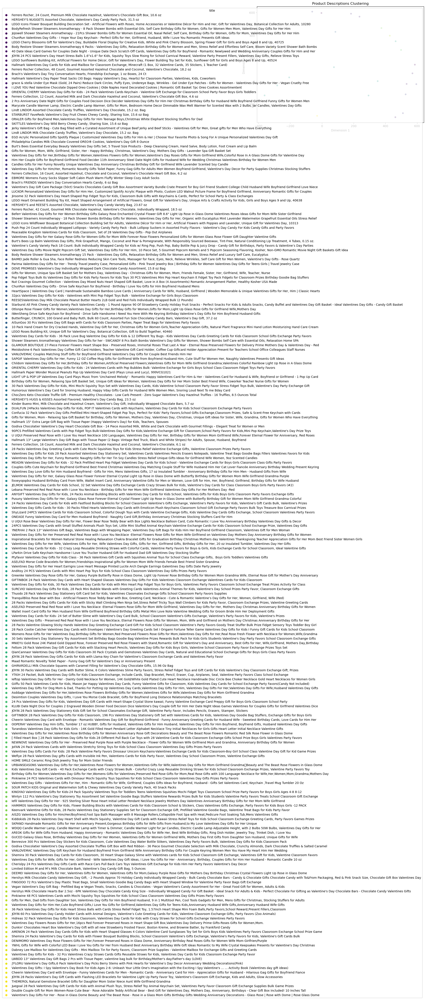

In [ ]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=reduced_embeddings[:, 0], y=reduced_embeddings[:, 1], hue=df['title'], palette='viridis')
plt.title('Product Descriptions Clustering')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend(title='Product Name')
plt.show()

<b>INFERENCE: </b>Colour closer to each other are in a similar area

#### Seperate the legend

C:\Users\jissr\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 65292 (\N{FULLWIDTH COMMA}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


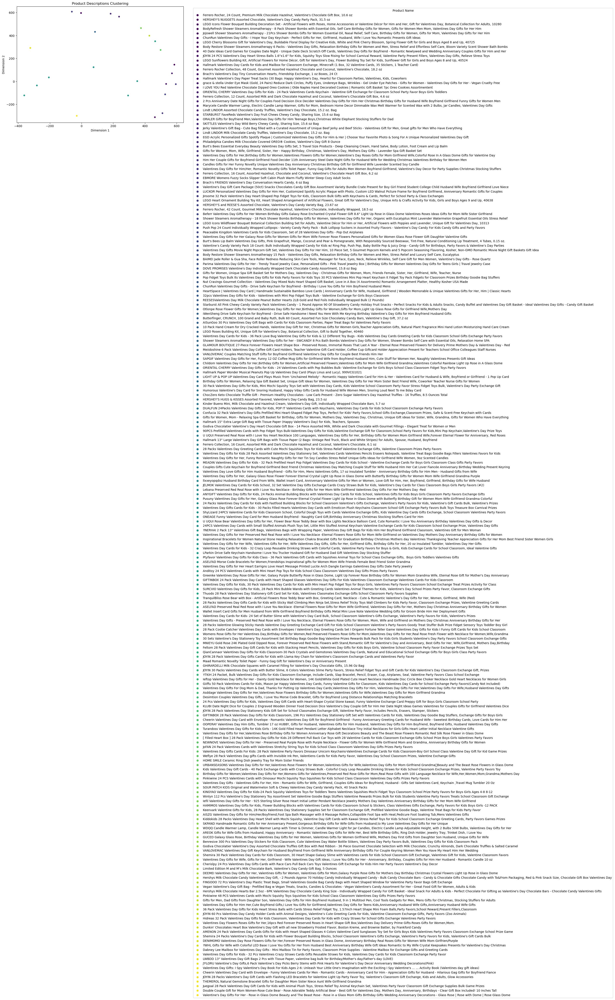

In [ ]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=reduced_embeddings[:, 0], y=reduced_embeddings[:, 1], hue=df['title'], palette='viridis')
plt.title('Product Descriptions Clustering')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend(title='Product Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


## Extracting sample for better visualization

C:\Users\jissr\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning:

Glyph 65292 (\N{FULLWIDTH COMMA}) missing from current font.



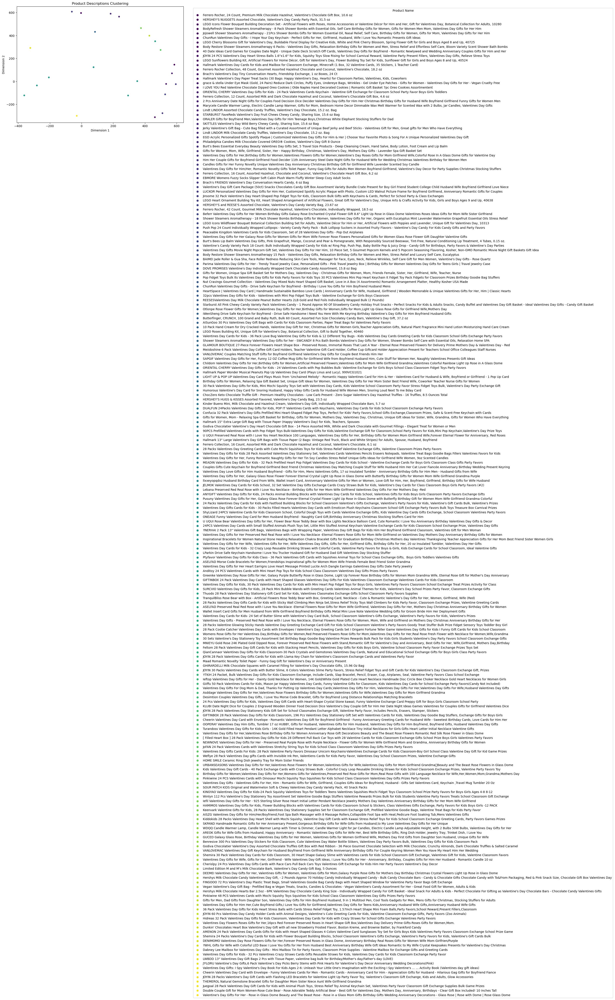

In [ ]:
sample_df = df.sample(n=10)
plt.figure(figsize=(10, 7))
sns.scatterplot(x=reduced_embeddings[:, 0], y=reduced_embeddings[:, 1], hue=df['title'], palette='viridis')
plt.title('Product Descriptions Clustering')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend(title='Product Name', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()
